In [1]:
IMG_SIZE = 384
TRAIN = False
CHUNK = 0
CHUNK_SIZE = 3200
SUB_CHUNK_SIZE = 800
CANDIDATES = 10
MASKED = False

In [2]:
import os
import psutil
import pickle
import random
import gzip
import gc
from time import time
from tqdm import tqdm
import json
import cv2
from collections import OrderedDict

import numpy as np
import pandas as pd
import torch
from torch.backends import cudnn
import torch.nn as nn
import torch.nn.functional as func
from torch.utils import data
from torch.utils.data import Subset, DataLoader
import torchvision
from sklearn.linear_model import LinearRegression

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.optim as optim
from torch.utils.data import Subset, DataLoader, Dataset, Subset

from emm_regressor import Trainer, ModelBase

INPUT_FOLDER = '../input/carplates/data/data'
SEED=42

def reseed(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    cudnn.benchmark = False
    cudnn.deterministic = True
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)


reseed()

In [3]:
START_CHECKPOINT='../input/made2-hw2-segmentation-train/checkpoint.pickle'

os.makedirs("train",exist_ok=True)
os.makedirs("test",exist_ok=True)


SMOOTH_RADIUS = 20
SMALL_RADIUS = 10
RATIO = 2.5

CROP_HEIGHT = 96
CROP_WIDTH = int(CROP_HEIGHT * RATIO)
WARPED_WIDTH = 192
WARPED_HEIGHT = 64

if torch.cuda.is_available():
    device = torch.device("cuda:0")
else:
    device = torch.device("cpu")
    SAMPLE = True
    EPOCHS = 2

In [4]:
class ModelSegmentation(ModelBase):
    def __init__(self, model, device, pos_weight):
        super().__init__(model, device)
        self.pos_weight = pos_weight
        self.loss = torch.nn.BCEWithLogitsLoss(pos_weight=pos_weight)
        self.cur_eval_index = 0
        self.samples_count = 0

    def train_batch(self, X, y, optimizer):
        prediction = self.model(X.to(self.device)).reshape(y.shape)
        y_dev = y.to(self.device)
        loss_value = self.loss(prediction, y_dev.type_as(prediction)).mean(dim=-1)
        optimizer.zero_grad()
        loss_value.backward()
        optimizer.step()
        prediction = (prediction > 0).long().detach().cpu()
        acc = torch.mean((prediction == y.long()).float()).item()
        loss = loss_value.item()
        return {"loss": loss, "train_acc": acc }

    def eval_begin(self, total_size):
        self.model.eval()
        self.ground_truth = None
        self.predictions = None
        self.cur_eval_index = 0
        self.samples_count = total_size

    def eval_batch(self, X, y):
        prediction = self.model(X.to(self.device)).reshape(y.shape)
        return torch.sigmoid(prediction).detach().cpu()

    def eval_append_results(self, predictions, ground_truth):
        new_index = self.cur_eval_index + len(ground_truth)
        if self.ground_truth is None:
            self.ground_truth = np.zeros((self.samples_count, predictions.shape[1], predictions.shape[2]), dtype=np.uint8)
            self.predictions = np.zeros((self.samples_count, predictions.shape[1], predictions.shape[2]), dtype=np.uint8)
        self.ground_truth[self.cur_eval_index:new_index, :, :] = (ground_truth.numpy()*255).astype(np.uint8)
        self.predictions[self.cur_eval_index:new_index, :, :] = (predictions.numpy()*255).astype(np.uint8)
        self.cur_eval_index = new_index

    def evaluate(self, prediction, ground_truth, **kwargs):
        prediction = (prediction > 127).astype(np.long)
        ground_truth = (ground_truth > 127).astype(np.long)
        N = prediction.size
        predicted_positive = int(prediction.sum())
        ground_positive = int(ground_truth.sum())
        TP = int((prediction * ground_truth).sum())
        FP = predicted_positive - TP
        FN = ground_positive - TP
        TN = N - FP - FN - TP
        precision = TP / predicted_positive if predicted_positive > 0 else 1
        recall = TP / ground_positive if ground_positive > 0 else 1
        f1 = (2 * precision * recall / (precision + recall)) if (precision + recall) > 0 else 0
        return {"TP": TP / N, "TN": TN / N, "FP": FP / N, "FN": FN / N, "acc": (TP + TN) / N, "prec": precision, "rec": recall, "F1": f1}

    def eval_complete(self, **kwargs):
        return self.predictions, self.ground_truth

    def epoch_metrics_format(self):
        return "LR:{learning_rate:.6f}, loss:{loss:.4f}, train_acc:{train_acc:.3f}, val_acc:{acc:.3f}, val_f1:{F1:.3f}"

    def batch_metrics_format(self):
        return "loss:{loss:.4f}, acc:{train_acc:.4f}"

    def target_metric(self):
        return "F1"

In [5]:
class CarPlateSegmentationDataset(Dataset):
    def __init__(self, img_size, train, folder=INPUT_FOLDER, sample=SAMPLE):
        if train:
            train = json.load(open(os.path.join(INPUT_FOLDER, 'train.json')))[:-1]  # last image is broken
            self.filenames = [data['file'] for data in train]
            self.boxes = [[np.array(box['box']).astype(np.float32) for box in data['nums']] for data in train]
            self.texts = [[box['text'] for box in data['nums']] for data in train]
        else:
            test_df = pd.read_csv(os.path.join(INPUT_FOLDER, 'submission.csv'))
            self.filenames = list (test_df.file_name.values)
            self.boxes = [None for f in self.filenames]
            self.texts = [None for f in self.filenames]
        self.paths = [os.path.join(INPUT_FOLDER, f) for f in self.filenames]
        self.img_size = img_size
        
    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, index):
        image = cv2.imread(self.paths[index])[:,:,::-1]

        h, w, _ = image.shape
        scale = min(self.img_size[1]/h, self.img_size[0]/w)
        image = cv2.resize(image, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)

        h, w, _ = image.shape
        dy = (self.img_size[1]-h) // 2
        dx = (self.img_size[0]-w) // 2
        img = torch.zeros((1,3,self.img_size[1],self.img_size[0]))
        img[0,:, dy:dy + image.shape[0], dx:dx + image.shape[1]] = torch.tensor(image).permute(2, 0, 1).float()/255.0
        return img,dx,dy,scale,self.filenames[index],self.boxes[index],self.texts[index]
    
dataset = CarPlateSegmentationDataset((IMG_SIZE,IMG_SIZE), train=TRAIN)

In [6]:
#https://github.com/mateuszbuda/brain-segmentation-pytorch/blob/master/unet.py
class UNet(nn.Module):

    def __init__(self, in_channels=3, out_channels=1, init_features=32):
        super(UNet, self).__init__()

        features = init_features
        self.encoder1 = UNet._block(in_channels, features, name="enc1")
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder2 = UNet._block(features, features * 2, name="enc2")
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder3 = UNet._block(features * 2, features * 4, name="enc3")
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder4 = UNet._block(features * 4, features * 8, name="enc4")
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.bottleneck = UNet._block(features * 8, features * 16, name="bottleneck")

        self.upconv4 = nn.ConvTranspose2d(
            features * 16, features * 8, kernel_size=2, stride=2
        )
        self.decoder4 = UNet._block((features * 8) * 2, features * 8, name="dec4")
        self.upconv3 = nn.ConvTranspose2d(
            features * 8, features * 4, kernel_size=2, stride=2
        )
        self.decoder3 = UNet._block((features * 4) * 2, features * 4, name="dec3")
        self.upconv2 = nn.ConvTranspose2d(
            features * 4, features * 2, kernel_size=2, stride=2
        )
        self.decoder2 = UNet._block((features * 2) * 2, features * 2, name="dec2")
        self.upconv1 = nn.ConvTranspose2d(
            features * 2, features, kernel_size=2, stride=2
        )
        self.decoder1 = UNet._block(features * 2, features, name="dec1")

        self.conv = nn.Conv2d(
            in_channels=features, out_channels=out_channels, kernel_size=1
        )

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))

        bottleneck = self.bottleneck(self.pool4(enc4))

        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat((dec4, enc4), dim=1)
        dec4 = self.decoder4(dec4)
        dec3 = self.upconv3(dec4)
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.decoder3(dec3)
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.decoder2(dec2)
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.decoder1(dec1)
        return self.conv(dec1) #torch.sigmoid()

    @staticmethod
    def _block(in_channels, features, name):
        return nn.Sequential(
            OrderedDict(
                [
                    (
                        name + "conv1",
                        nn.Conv2d(
                            in_channels=in_channels,
                            out_channels=features,
                            kernel_size=3,
                            padding=1,
                            bias=False,
                        ),
                    ),
                    (name + "norm1", nn.BatchNorm2d(num_features=features)),
                    (name + "relu1", nn.ReLU(inplace=True)),
                    (
                        name + "conv2",
                        nn.Conv2d(
                            in_channels=features,
                            out_channels=features,
                            kernel_size=3,
                            padding=1,
                            bias=False,
                        ),
                    ),
                    (name + "norm2", nn.BatchNorm2d(num_features=features)),
                    (name + "relu2", nn.ReLU(inplace=True)),
                ]
            )
        )

In [7]:
model = UNet(in_channels=3, out_channels=1, init_features=8)

model = model.to(device)

trainer = Trainer(ModelSegmentation(model, device, torch.tensor(1)),
                  lambda model: torch.optim.AdamW(model.model.parameters(), lr=3E-4),
                  train_dataset=dataset, batch_size=64, outdir='./', start_from_checkpoint=START_CHECKPOINT,
                  n_best_models=2, min_val_score=-3, verbose=False)

reseed(SEED + trainer.total_epochs)

In [8]:
def make_kernel(radius):
    result = torch.zeros((1, 1, radius * 2 + 1, radius * 2 + 1))
    for x in range(radius * 2 + 1):
        for y in range(radius * 2 + 1):
            result[0, 0, y, x] = np.sqrt((x - radius) ** 2 + (y - radius) ** 2)
    result = 1 - result / (radius * 2)
    return result / result.sum()

def make_kernel(radius):
    result = torch.zeros((1, 1, radius * 2 + 1, radius * 2 + 1))
    for x in range(radius * 2 + 1):
        for y in range(radius * 2 + 1):
            result[0, 0, y, x] = np.sqrt((x - radius) ** 2 + (y - radius) ** 2)
    result = 1 - result / (radius * 2)
    return result / result.sum()


def recover(mask, f_mask, image, threshold=0.01, masked=MASKED):
    if f_mask.max() == 0 or image.shape[0] == 0 or image.shape[1] == 0:
        return None, None, None, 0, 0
    f_mask = cv2.resize(f_mask, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_AREA)
    mask = cv2.resize(mask, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_AREA)
    f_mask = f_mask / f_mask.max()
    f_mask = f_mask * (f_mask > threshold)
    t, l, b, r = calc_crop(f_mask, 0.01)
    mask = mask[t:b + 1, l:r + 1]
    f_mask = f_mask[t:b + 1, l:r + 1]
    image = image[t:b + 1, l:r + 1]
    center_line = np.argmax(f_mask, axis=0)
    model = LinearRegression()
    model.fit(np.arange(len(center_line))[..., None], center_line[..., None])
    k = model.coef_[0, 0]
    b = model.intercept_[0]
    w, h = image.shape[1], image.shape[0]
    d = h // 2 if b < h // 2 else - h // 2
    pts1 = np.float32([[0, b], [0, b + d], [w - 1, (w - 1) * k + b]])
    pts2 = np.float32([[0, (h // 2)], [0, h // 2 + d], [w - 1, (h // 2)]])
    M = cv2.getAffineTransform(pts1, pts2)
    masked_warped_image = cv2.warpAffine((image * mask[..., None]).astype(np.uint8), M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_DEFAULT)
    tw, lw, bw, rw = calc_crop(masked_warped_image, 4)
    if masked:
        warped_image = masked_warped_image[tw:bw + 1, lw:rw + 1]
    else:
        warped_image = cv2.warpAffine(image.astype(np.uint8), M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_DEFAULT)
        warped_image = warped_image[tw:bw + 1, lw:rw + 1]
    return mask, image, warped_image, l, t


def calc_crop(mask, threshold):
    t, l, b, r = 0, 0, mask.shape[0] - 1, mask.shape[1] - 1
    while t < b and mask[t, :].mean() < threshold: t += 1
    while b > t and mask[b, :].mean() < threshold: b -= 1
    while l < r and mask[:, l].mean() < threshold: l += 1
    while r > l and mask[:, r].mean() < threshold: r -= 1
    return t, l, b, r


def resize_and_crop(image, width, height):
    scale = min(width / image.shape[1], height / image.shape[0])
    image = cv2.resize(image, None, fx=scale, fy=scale, interpolation=cv2.INTER_CUBIC)

    h, w, _ = image.shape
    dy = (height - h) // 2
    dx = (width - w) // 2
    result_image = np.zeros((height, width, 3), dtype=np.uint8)
    result_image[dy:dy + image.shape[0], dx:dx + image.shape[1], :] = image
    return result_image, scale, dx, dy, image.shape


def crop_all(image, mask, raw_box, width=CROP_WIDTH, height=CROP_HEIGHT):
    result_image, scale, dx, dy, shape = resize_and_crop(image, width, height)

    mask = cv2.resize(mask, (shape[1], shape[0]), interpolation=cv2.INTER_CUBIC)
    box = raw_box * scale if raw_box is not None else None
    result_mask = np.zeros((height, width), dtype=np.uint8)
    result_mask[dy:dy + shape[0], dx:dx + shape[1]] = mask
    box = (box + np.array([dx, dy])) if box is not None else None
    return result_image, result_mask, box

def crop_img(image, raw_box, width=CROP_WIDTH, height=CROP_HEIGHT):
    result_image, scale, dx, dy, shape = resize_and_crop(image, width, height)
    box = raw_box * scale if raw_box is not None else None
    box = (box + np.array([dx, dy])) if box is not None else None
    return result_image, box, scale, dx, dy


SMOOTH_RADIUS = 3
LARGE_RADIUS = 30
SMALL_RADIUS = 10
smooth_kernel = make_kernel(SMOOTH_RADIUS)
kernel = make_kernel(LARGE_RADIUS)
small_kernel = make_kernel(SMALL_RADIUS)


def find_candidate_crops(predictions, indices, filenames, dxs, dys, scales, texts=None, boxes=None, count=CANDIDATES, crop_size=(192,144)):
    IMG_SIZE = predictions.shape[1:]

    p = torch.tensor(predictions).reshape(predictions.shape[0], 1, predictions.shape[1], predictions.shape[2]).float() / 255.0
    candidates = []
    crops = []
    warped_crops = []
    N = predictions.shape[0]
    for i in range(count):
        pred = func.conv2d(p, kernel, padding=LARGE_RADIUS).reshape(predictions.shape[0], predictions.shape[1], predictions.shape[2]).numpy()
        max_idx = np.argmax(pred.reshape(N, -1), axis=1)
        max_y = max_idx // IMG_SIZE[1]
        max_x = max_idx - max_y * IMG_SIZE[1]
        
        s = (np.sqrt(pred[np.arange(N), max_y, max_x]) * LARGE_RADIUS)
        conf_left = np.maximum(0, max_x - s * RATIO).astype(np.int32)
        conf_right = np.minimum(IMG_SIZE[1], max_x + s * RATIO).astype(np.int32)
        conf_top = np.maximum(0, max_y - s).astype(np.int32)
        conf_bottom = np.minimum(IMG_SIZE[0], max_y + s).astype(np.int32)
        
        sw = s * 10
        sh = sw*crop_size[1]//crop_size[0]
        
        for j in range(N):
            conf = p[j, :, conf_top[j]:conf_bottom[j], conf_left[j]:conf_right[j]].mean()
            p[j, :, conf_top[j]:conf_bottom[j], conf_left[j]:conf_right[j]] = 0
            scale, dx, dy = scales[j], dxs[j], dys[j]
            if i == 0 or conf > 0.01:
                image = cv2.imread(os.path.join(INPUT_FOLDER, filenames[j]))
                h, w = image.shape[0], image.shape[1]
                cx, cy = int((max_x[j]-dx) / scale), int((max_y[j]-dy) / scale)
                ww, hh = sw[j]/scale, sh[j]/scale
                sc = min(1, h/hh/2, w/ww/2)
                ww, hh = int(ww*sc), int(hh*sc)
                t, l = np.maximum(0,cy-hh), np.maximum(0,cx-ww)
                b = t + hh*2
                r = l + ww*2
                b, r = np.minimum(b,h), np.minimum(r,w)
                t, l = np.minimum(b-2*hh,t), np.minimum(r-2*ww,l)
                left, right, top, bottom =  int(l*scale+dx), int(r*scale+dx), int(t*scale+dy), int(b*scale+dy)
                image = image[t:b, l:r, ::-1].copy()
                if image.shape[0] * image.shape[1] == 0:
                    continue
                raw_box = None
                text = ""
                if boxes is not None:
                    # find nearest box
                    closest = 1000000000000
                    for cur, txt in zip(boxes[j], texts[j]):
                        center = cur.reshape(-1,2).mean(axis=0)
                        dist = (center[0] - cx) ** 2 + (center[1] - cy) ** 2
                        if dist < closest:
                            closest = dist
                            raw_box = cur
                            text = txt
                crop, box, scale, dx, dy = crop_img(image, raw_box, width=crop_size[0], height=crop_size[1])
                crops.append(crop)
                target = None
                if raw_box is not None:
                    target = (raw_box[:, 0].min() >= l) and (raw_box[:, 1].min() >= t) and (raw_box[:, 0].max() <= r) and (raw_box[:, 1].max() <= b)
                candidates.append({
                    'img_idx': indices[j],
                    'filename': filenames[j],
                    'conf': conf,
                    'cl': left, 'cr': right, 'ct': top, 'cb': bottom, 'cx': max_x[j], 'cy': max_y[j],
                    'l': l, 'r': r, 't': t, 'b': b, 'x': (l + r) // 2, 'y': (t + b) // 2,
                    'w': r - l, 'h': b - t,
                    'raw_box': None if raw_box is None else raw_box.reshape(-1,2),
                    'box': None if box is None else box.reshape(-1,2),
                    'text': text, 'class': target
                })
    return candidates, np.stack(crops)


def find_candidates(predictions, indices, filenames, dxs, dys, scales, texts=None, boxes=None, targets=None, count=5):
    IMG_SIZE = predictions.shape[1:]
    p = torch.tensor(predictions).reshape(predictions.shape[0], 1, predictions.shape[1], predictions.shape[2]).float() / 255.0
    predictions = (func.conv2d(p, smooth_kernel, padding=SMOOTH_RADIUS).reshape(predictions.shape[0], predictions.shape[1], predictions.shape[2]).numpy()*255).astype(np.uint8)
    candidates = []
    crops = []
    warped_crops = []
    N = predictions.shape[0]
    for i in range(count):
        pred = func.conv2d(p, kernel, padding=LARGE_RADIUS).reshape(predictions.shape[0], predictions.shape[1], predictions.shape[2]).numpy()
        pred_s = func.conv2d(p, small_kernel, padding=SMALL_RADIUS).reshape(predictions.shape[0], predictions.shape[1], predictions.shape[2]).numpy()
        max_idx = np.argmax(pred.reshape(N, -1), axis=1)
        max_y = max_idx // IMG_SIZE[1]
        max_x = max_idx - max_y * IMG_SIZE[1]
        s = (np.sqrt(pred[np.arange(N), max_y, max_x]) * LARGE_RADIUS * 1.5)
       
        sw = np.minimum(s * RATIO, IMG_SIZE[1]//2)
        sh = np.minimum(s, IMG_SIZE[0]//2)
        
        left = np.maximum(0, max_x - sw).astype(np.int32)
        right = np.minimum(IMG_SIZE[1], left + 2*sw).astype(np.int32)
        left = np.minimum(left, right - 2*sw).astype(np.int32)
        top = np.maximum(0, max_y - sh).astype(np.int32)
        bottom = np.minimum(IMG_SIZE[0], top + 2*sh).astype(np.int32)
        top = np.minimum(top, bottom - 2*sh).astype(np.int32)
        
        for j in range(N):
            conf = p[j, :, top[j]:bottom[j], left[j]:right[j]].mean()
            p[j, :, top[j]:bottom[j], left[j]:right[j]] = 0
            scale, dx, dy = scales[j], dxs[j], dys[j]
            if i == 0 or conf > 0.01:
                image = cv2.imread(os.path.join(INPUT_FOLDER, filenames[j]))
                h, w = image.shape[0], image.shape[1]
                t, b, l, r = int(np.clip((top[j] - dy) / scale, 0, h)), int(np.clip((bottom[j] - dy) / scale, 0, h)), \
                             int(np.clip((left[j] - dx) / scale, 0, w)), int(np.clip((right[j] - dx) / scale, 0, w))
                image = image[t:b, l:r, ::-1].copy()
                if image.shape[0] * image.shape[1] == 0:
                    continue
                mask = predictions[j, top[j]:bottom[j], left[j]:right[j]].astype(np.float) / 255.0
                f_mask = pred_s[j, top[j]:bottom[j], left[j]:right[j]]
                msk, img, warped_image, rdx, rdy = recover(mask, f_mask, image)
                raw_box = None if boxes is None else boxes[j]
                text = None if texts is None else texts[j]
                target = None if targets is None else targets[j]
                if msk is None or warped_image.shape[0] * warped_image.shape[1] == 0:
                    crop, mask_crop, box = crop_all(image, mask, raw_box)
                    if MASKED:
                        warped_crop = (crop * mask_crop[..., None]).astype(np.uint8)
                    else:
                        warped_crop = crop
                else:
                    crop, mask_crop, box = crop_all(img, msk, raw_box)
                    warped_crop, _, _, _, _ = resize_and_crop(warped_image, WARPED_WIDTH, WARPED_HEIGHT)
                crops.append(crop)
                warped_crops.append(warped_crop)
                candidates.append({
                    'img_idx': indices[j],
                    'filename': filenames[j],
                    'cl': left[j], 'cr': right[j], 'ct': top[j], 'cb': bottom[j], 'cx': max_x[j], 'cy': max_y[j],
                    'l': l, 'r': r, 't': t, 'b': b, 'x': (l + r) // 2, 'y': (t + b) // 2,
                    'w': r - l, 'h': b - t,
                    'conf': conf,
                    'raw_box': None if raw_box is None else raw_box.reshape(-1,2),
                    'box': None if box is None else box.reshape(-1,2),
                    'text': text,
                    'class': target
                })
    return candidates, np.stack(crops), np.stack(warped_crops)


def mix(image, mask, alpha, color):
    image=cv2.resize(image,(mask.shape[1],mask.shape[0]))
    mask = mask[:, :, None] / 255.0 * alpha
    return (image * (1 - mask) + (mask @ np.array(color)[None, :])).astype(np.uint8)


def draw_crop_candidates(dataset, texts, predictions, candidates, crops, samples=32, alpha=0.8, color=(0, 255, 0)):
    indices = np.arange(samples)
    candidates_map = {i: [] for i in indices}
    crops_map = {i: [] for i in indices}
    for i in range(len(candidates)):
        if candidates[i]['img_idx'] in candidates_map:
            candidates_map[candidates[i]['img_idx']].append(candidates[i])
            crops_map[candidates[i]['img_idx']].append(crops[i])
    for i, idx in enumerate(indices):
        candidates = candidates_map[idx]
        crops = crops_map[idx]
        cols = len(crops) + 1
        plt.figure(figsize=(24, 6))
        image=(dataset[idx][0][0].permute(1, 2, 0).numpy()*255).astype(np.uint8)
        image = cv2.UMat(mix(image , predictions[idx, :, :], alpha, color))
        for ci, c in enumerate(candidates):
            l, r, t, b, x, y = c['cl'], c['cr'], c['ct'], c['cb'], c['cx'], c['cy']
            pts = np.array([[l, b], [l, t], [r, t], [r, b]], dtype=np.int32)
            clr = (15 - ci) * 255.0 / 15
            image = cv2.polylines(image, [pts.reshape(-1, 1, 2)], True, (clr, 0, 0), lineType=cv2.LINE_AA)
            image = cv2.circle(image, (x, y), 1, (clr, 0, 0), lineType=cv2.LINE_AA)
        plt.subplot(1, cols, 1)
        plt.imshow(cv2.UMat.get(image))
        plt.xticks([])
        plt.yticks([])
        if texts is not None:
            plt.title(texts[idx])
        for ci, (c, crop, warped_crop) in enumerate(zip(candidates, crops, warped_crops)):
            crop = cv2.UMat(crop)
            if c['box'] is not None:
                crop = cv2.polylines(crop, [c['box'].astype(np.int32)], True, (255, 0, 0), lineType=cv2.LINE_AA)
            plt.subplot(1, cols, ci + 2)
            plt.imshow(cv2.UMat.get(crop))
            plt.xticks([])
            plt.yticks([])
            plt.title("%.3f %s (%d)" % (c['conf'],c['text'],0 if c['class'] is None else c['class']))
        plt.show()

        
def draw_candidates(crop_crops, predictions, candidates, crops, warped_crops, samples=32, alpha=0.8, color=(0, 255, 0)):
    cols = 3
    rows = min(samples,crop_crops.shape[0])
    plt.figure(figsize=(24, 8*rows))
    for i in range(rows):
        c = candidates[i];
        plt.subplot(rows, cols, i*cols + 1)
        image = cv2.UMat(mix(crop_crops[i] , predictions[i], alpha, color))
        l, r, t, b, x, y = c['cl'], c['cr'], c['ct'], c['cb'], c['cx'], c['cy']
        pts = np.array([[l, b], [l, t], [r, t], [r, b]], dtype=np.int32)
        image = cv2.polylines(image, [pts.reshape(-1, 1, 2)], True, (255, 0, 0), lineType=cv2.LINE_AA)
        image = cv2.circle(image, (x, y), 1, (255, 0, 0), lineType=cv2.LINE_AA)
        plt.imshow(cv2.UMat.get(image))
        plt.xticks([])
        plt.yticks([])
        plt.title(c['filename'])

        plt.subplot(rows, cols, i*cols + 2)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(crops[i])
        plt.title(c['text'])

        plt.subplot(rows, cols, i*cols + 3)
        plt.imshow(warped_crops[i])
        plt.xticks([])
        plt.yticks([])
        plt.title(f"{c['class']}")
    plt.show()

In [9]:
def process(model, dataset, start_idx, size, train):
    predictions = []
    filenames = []
    dxs = []
    dys = []
    scales = []
    boxes = []
    texts = []
    indices = []
    with torch.no_grad():
        for i in tqdm(np.arange(start_idx, start_idx+size)):
            filename = dataset.filenames[i]
            img, dx, dy, scale, filename, cur_boxes, cur_texts = dataset[i]
            pred = (torch.sigmoid(model(img.to(device)).detach())[0][0].numpy()*255).astype(np.uint8)
            predictions.append(pred)
            filenames.append(filename)
            boxes.append(cur_boxes)
            texts.append(cur_texts)
            dxs.append(dx)
            dys.append(dy)
            scales.append(scale)
            indices.append(i)

    crop_predictions = np.stack(predictions)
    crop_candidates, crop_crops = find_candidate_crops(crop_predictions, indices, filenames, dxs, dys, scales, texts if train else None, boxes if train else None, count=5, crop_size=(192,144))
    
    predictions = []
    filenames = []
    dxs = []
    dys = []
    scales = []
    boxes = []
    texts = []
    targets = []
    indices = []
    with torch.no_grad():
        for i in tqdm(range(crop_crops.shape[0])):
            img = torch.tensor(crop_crops[i]).permute(2,0,1)[None,...].float()/255.0
            c = crop_candidates[i]
            pred = (torch.sigmoid(model(img.to(device)).detach())[0][0].numpy()*255).astype(np.uint8)
            predictions.append(pred)
            filenames.append(c['filename'])
            boxes.append(c['raw_box'])
            texts.append(c['text'])
            targets.append(c['class'])
            scale=pred.shape[1]/c['w']
            dxs.append(-c['l']*scale)
            dys.append(-c['t']*scale)
            scales.append(scale)
            indices.append(c['img_idx'])

    # (top - dy) / scale
    predictions = np.stack(predictions)
    candidates, crops, warped_crops = find_candidates(predictions, indices, filenames, dxs, dys, scales, texts if train else None, boxes if train else None, targets if train else None, count=1)
    return candidates, crops, warped_crops, predictions, texts, crop_predictions, crop_candidates, crop_crops

In [ ]:
%%time
candidates, crops, warped_crops, predictions, texts, crop_predictions, crop_candidates, crop_crops = process(model, dataset, 0, 32, train=TRAIN)
draw_crop_candidates(dataset, texts, crop_predictions, crop_candidates, crop_crops, samples=32)

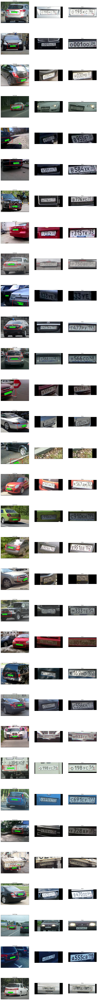

In [11]:
draw_candidates(crop_crops, predictions, candidates, crops, warped_crops)

In [12]:
%%time
prefix = 'train' if TRAIN else 'test'

for i in range(0,CHUNK_SIZE, SUB_CHUNK_SIZE):
    candidates, crops, warped_crops, _, _, _, _, _ = process(model, dataset, CHUNK*CHUNK_SIZE + i, min(SUB_CHUNK_SIZE,len(dataset)-CHUNK*CHUNK_SIZE - i), train=TRAIN)
    with gzip.open(f"{prefix}_candidates_{CHUNK}_{i}.pthz", 'wb', 5) as f:
        torch.save(candidates, f)
    with gzip.open(f"{prefix}_crops_{CHUNK}_{i}.pthz", 'wb', 5) as f:
        torch.save(crops, f)
    with gzip.open(f"{prefix}_warped_crops_{CHUNK}_{i}.pthz", 'wb', 5) as f:
        torch.save(warped_crops, f)
    del candidates, crops, warped_crops
    gc.collect()

100%|██████████| 3166/3166 [01:28<00:00, 35.95it/s]


CPU times: user 5h 26min 12s, sys: 1min 34s, total: 5h 27min 47s
Wall time: 2h 47min 26s


In [13]:
!ls -l

total 608004
---------- 1 root root     31588 Jun 19 09:47 __notebook__.ipynb
drwxr-xr-x 2 root root      4096 Jun 19 09:48 test
-rw-r--r-- 1 root root    559473 Jun 19 10:31 test_candidates_0_0.pthz
-rw-r--r-- 1 root root    558305 Jun 19 11:56 test_candidates_0_1600.pthz
-rw-r--r-- 1 root root    547340 Jun 19 12:37 test_candidates_0_2400.pthz
-rw-r--r-- 1 root root    548865 Jun 19 11:13 test_candidates_0_800.pthz
-rw-r--r-- 1 root root 104461049 Jun 19 10:31 test_crops_0_0.pthz
-rw-r--r-- 1 root root 103875639 Jun 19 11:56 test_crops_0_1600.pthz
-rw-r--r-- 1 root root 101508639 Jun 19 12:37 test_crops_0_2400.pthz
-rw-r--r-- 1 root root 101866091 Jun 19 11:14 test_crops_0_800.pthz
-rw-r--r-- 1 root root  52482062 Jun 19 10:32 test_warped_crops_0_0.pthz
-rw-r--r-- 1 root root  52536250 Jun 19 11:56 test_warped_crops_0_1600.pthz
-rw-r--r-- 1 root root  51830236 Jun 19 12:37 test_warped_crops_0_2400.pthz
-rw-r--r-- 1 root root  51750766 Jun 19 11:14 test_warped_crops_0_800.pthz
drwxr-x